In [1]:
pip install lime

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 275.7/275.7 kB 5.5 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for lime: filename=lime-0.2.0.1-py3-none-any.whl size=283835 sha256=0c5cc5bcbe04fb54d01e4d82d7a959493270b8b9ccf33f6e38948ed00359be13
  Stored in directory: /root/.cache/pip/wheels/fd/a2/af/9ac0a1a85a27f314a06b39e1f492bee1547d52549a4606ed89
Successfully built lime


In [2]:
import pandas as pd
df = pd.read_csv("/content/Derby_new.csv")
df.head()

,title,description,label
0,Network Server Protocol error when select fail...,Reporting for Army filed on derby-dev list.If...,0
1,NPE when trying to create a database at a dire...,Opening this bug on behalf of Daniel Debrunner...,0
2,Make LOCKS as non-reserved keyword in Derby si...,Since LOCKS is not a reserved keyword in SQL s...,0
3,When using encryption do not store the length...,When using derby database encryption there is ...,1
4,Support for like ? Escape ?,Request to have support forSelect * from foo w...,0


In [21]:
# Data Analysis
import pandas as pd
import numpy as np

# Data Visualization
from matplotlib import pyplot as plt
import seaborn as sns

# Machine Learning
from sklearn.feature_extraction.text import CountVectorizer, TfidfVectorizer
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score,auc, precision_score, recall_score, roc_auc_score, roc_curve, confusion_matrix,f1_score
from imblearn.over_sampling import SMOTE
from sklearn.linear_model import LogisticRegression
from sklearn.naive_bayes import MultinomialNB
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from xgboost import XGBClassifier

# NLP
from nltk.tokenize import word_tokenize
from nltk.corpus import stopwords
from nltk.stem import PorterStemmer
from wordcloud import WordCloud, STOPWORDS
import re

# Warning
import warnings
warnings.filterwarnings('ignore')

Train and Test CSV files

In [4]:
import pandas as pd
from sklearn.model_selection import train_test_split

# Load your CSV file into a pandas DataFrame
data = pd.read_csv("/content/Derby_new.csv")

# Split the data into features (X) and target variable (y) assuming the last column is the target variable
X = data.iloc[:, :-1]  # Features
y = data.iloc[:, -1]   # Target variable

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Concatenate features and target variable for training and testing sets
train_data = pd.concat([X_train, y_train], axis=1)
test_data = pd.concat([X_test, y_test], axis=1)

# Save the training and testing data to CSV files
train_data.to_csv("train.csv", index=False)
test_data.to_csv("test.csv", index=False)


In [5]:
# Loading train data
train_df = pd.read_csv('/content/train.csv')
print(f'Train data shape: {train_df.shape}')
train_df.head()

Train data shape: (800, 3)


,title,description,label
0,Column names on ResultSet.updateXXX and getXXX...,Sections 14.2.3 and &#91;14.2.3&#93; of JDBC 3...,0
1,StoreStreamClob.getReader(charPos) performs po...,StoreStreamClob.getReader(charPos) performs po...,0
2,setTimestamp() methods don't agree on trailing...,With the statement VALUES CAST(? AS VARCHAR(29...,0
3,Add tests of generated columns when sql author...,Add tests of generated columns under sql autho...,0
4,Get upgrade tests to pass on OJEC 1.1,The upgrade tests fail on OJEC 1.1 because Der...,0


In [6]:
# Loading test data
test_df = pd.read_csv('/content/test.csv')
print(f'Test data shape: {test_df.shape}')
test_df.head()

Test data shape: (200, 3)


,title,description,label
0,Revoking EXECUTE privilege on a function if us...,The docs say that REVOKE EXECUTE ... RESTRICT ...,1
1,[patch] reduce superfluous boxing histrionics,code converts strings to primitives using exce...,0
2,[patch] use string buffers when building strin...,Various spots in code builds up strings in loo...,0
3,NPE in JBitSet,A NPE occurs at org.apache.derby.iapi.util.JBi...,1
4,Derby does not resolve functions bound to meth...,Varargs were added in Java 5. It would be nice...,0


In [7]:
# Duplicates check
train_df.duplicated().sum()

0

In [8]:
# Data types check
train_df.dtypes

title          object
description    object
label           int64
dtype: object

In [9]:
# Missing values check
print(f'Missing values in train data:\n{train_df.isnull().sum()}')
print('-'*40)
print(f'Missing values in test data:\n{test_df.isnull().sum()}')

Missing values in train data:
title          0
description    0
label          0
dtype: int64
----------------------------------------
Missing values in test data:
title          0
description    0
label          0
dtype: int64


In [10]:
import pandas as pd

# Assuming you have already loaded your train and test DataFrames as train_df and test_df

# Remove missing values from the train DataFrame
train_df = train_df.dropna()

# Remove missing values from the test DataFrame
test_df = test_df.dropna()

# Check if missing values are removed
print(f'Missing values in train data after removal:\n{train_df.isnull().sum()}')
print('-'*40)
print(f'Missing values in test data after removal:\n{test_df.isnull().sum()}')

Missing values in train data after removal:
title          0
description    0
label          0
dtype: int64
----------------------------------------
Missing values in test data after removal:
title          0
description    0
label          0
dtype: int64


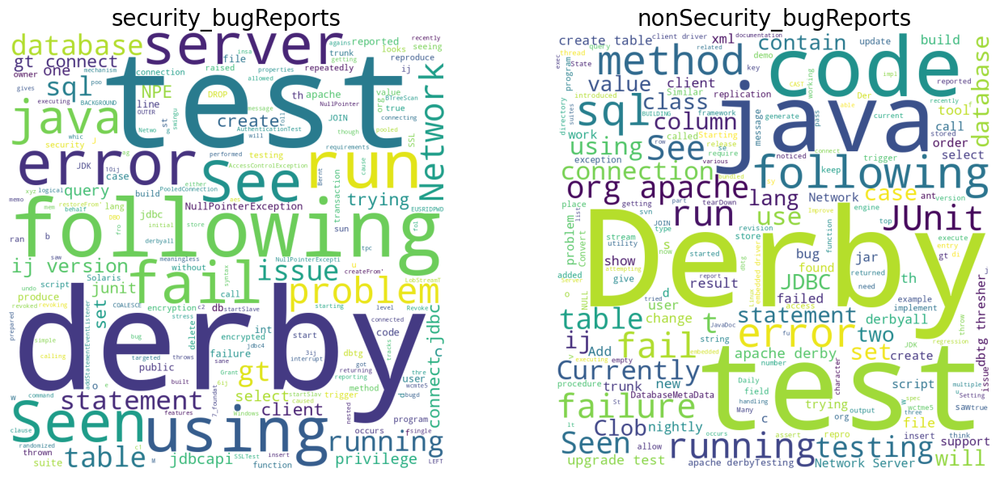

In [11]:
# Plotting wordclouds
stopwords = set(STOPWORDS)

security_bugReports = train_df['description'][train_df['label']==1].to_string()
wordcloud_negative = WordCloud(width = 800, height = 800,
                               background_color ='white', stopwords = stopwords,
                               min_font_size = 10).generate(security_bugReports)

nonSecurity_bugReports = train_df['description'][train_df['label']==0].to_string()
wordcloud_positive = WordCloud(width = 800, height = 800,
                               background_color ='white', stopwords = stopwords,
                               min_font_size = 10).generate(nonSecurity_bugReports)

# Plotting the WordCloud images
plt.figure(figsize=(14, 6), facecolor = None)

plt.subplot(1, 2, 1)
plt.imshow(wordcloud_negative)
plt.axis("off")
plt.title('security_bugReports', fontdict={'fontsize': 20})

plt.subplot(1, 2, 2)
plt.imshow(wordcloud_positive)
plt.axis("off")
plt.title('nonSecurity_bugReports', fontdict={'fontsize': 20})

plt.tight_layout()
plt.show()

Data Preprocessing

In [12]:
# Train-Test Splitting
X = train_df.drop(columns=['label'])
y = train_df['label']
test = test_df
print(X.shape, test.shape, y.shape)
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=10)
print(X_train.shape, X_test.shape, y_train.shape, y_test.shape)

(800, 2) (200, 3) (800,)
(640, 2) (160, 2) (640,) (160,)


In [13]:
X_train.dtypes

title          object
description    object
dtype: object

Text Normalization

In [14]:
# Function to tokenize and clean the text
def tokenize_and_clean(text):
    # Changing case of the text to lower case
    lowered = text.lower()

    # Cleaning the text
    cleaned = re.sub('@user', '', lowered)

    # Tokenization
    tokens = word_tokenize(cleaned)
    filtered_tokens = [token for token in tokens if re.match(r'\w{1,}', token)]

    # Stemming
    stemmer = PorterStemmer()
    stems = [stemmer.stem(token) for token in filtered_tokens]
    return stems

**Vectorization**

In [15]:
import nltk
nltk.download('punkt')

[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Unzipping tokenizers/punkt.zip.


True

In [16]:
# BOW Vectorization

# TF-IDF Vectorization
tfidf_vectorizer = TfidfVectorizer(tokenizer=tokenize_and_clean, stop_words='english')
X_train_tfidf = tfidf_vectorizer.fit_transform(X_train['description'])
X_test_tfidf = tfidf_vectorizer.transform(X_test['description'])
print(X_train_tfidf.shape, X_test_tfidf.shape)

# TF-IDF Vectorization on full training data
tfidf_vectorizer_full = TfidfVectorizer(tokenizer=tokenize_and_clean, stop_words='english')
X_tfidf = tfidf_vectorizer_full.fit_transform(X['description'])
test_tfidf = tfidf_vectorizer_full.transform(test['description'])
print(X_tfidf.shape, test_tfidf.shape)

(640, 10012) (160, 10012)
(800, 11756) (200, 11756)


**SMOTE**

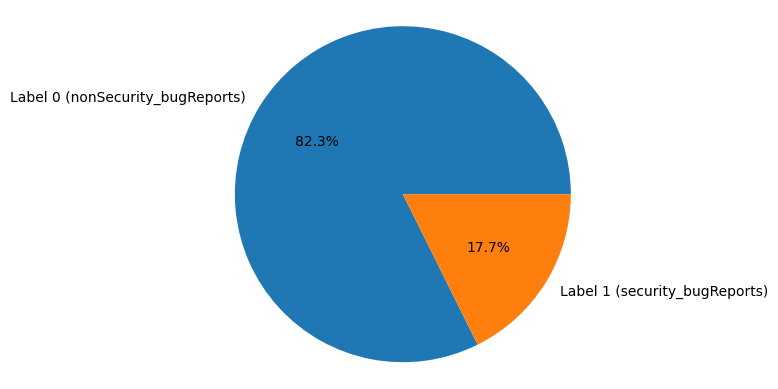

In [17]:
# Class Imbalance Check
plt.pie(y_train.value_counts(),
        labels=['Label 0 (nonSecurity_bugReports)', 'Label 1 (security_bugReports)'],
        autopct='%0.1f%%')
plt.axis('equal')
plt.show()

(1054, 10012) (1054,)
(1326, 11756) (1326,)


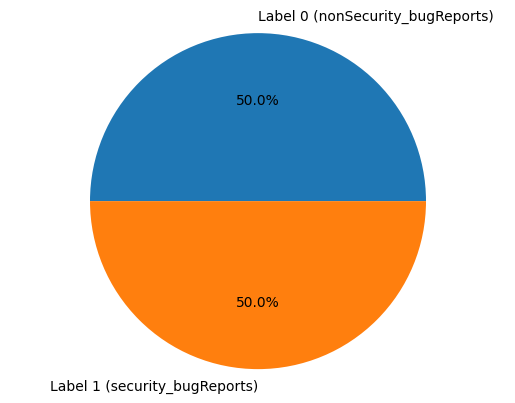

In [18]:
# SMOTE to deal with the class imbalance
smote = SMOTE()
X_train_smote, y_train_smote = smote.fit_resample(X_train_tfidf, y_train.values)
print(X_train_smote.shape, y_train_smote.shape)

# SMOTE on full training data
smote = SMOTE()
X_smote, y_smote = smote.fit_resample(X_tfidf, y.values)
print(X_smote.shape, y_smote.shape)

# Class Imbalance Check
plt.pie(pd.value_counts(y_train_smote),
        labels=['Label 0 (nonSecurity_bugReports)', 'Label 1 (security_bugReports)'],
        autopct='%0.1f%%')
plt.axis('equal')
plt.show()

ML **Modeling**

In [19]:
# Functions to print scores
def training_scores(y_act, y_pred):
    acc = round(accuracy_score(y_act, y_pred), 3)
    precision = round(precision_score(y_act, y_pred), 3)
    recall = round(recall_score(y_act, y_pred), 3)
    f1 = round(f1_score(y_act, y_pred), 3)
    roc_auc = round(roc_auc_score(y_act, y_pred), 3)
    print(f'Training Scores: Accuracy={acc}, precision={precision}, recall={recall}, F1-Score={f1}, roc={roc_auc}')

def validation_scores(y_act, y_pred):
    acc = round(accuracy_score(y_act, y_pred), 3)
    precision = round(precision_score(y_act, y_pred), 3)
    recall = round(recall_score(y_act, y_pred), 3)
    f1 = round(f1_score(y_act, y_pred), 3)
    roc_auc = round(roc_auc_score(y_act, y_pred), 3)
    print(f'Validation Scores: Accuracy={acc}, precision={precision}, recall={recall}, F1-Score={f1}, roc={roc_auc}')

In [22]:
# Logistic Regression
lr = LogisticRegression()
lr.fit(X_train_smote, y_train_smote)
y_train_pred = lr.predict(X_train_smote)
y_test_pred = lr.predict(X_test_tfidf)
training_scores(y_train_smote, y_train_pred)
validation_scores(y_test, y_test_pred)

Training Scores: Accuracy=0.963, precision=0.949, recall=0.979, F1-Score=0.964, roc=0.963
Validation Scores: Accuracy=0.838, precision=0.467, recall=0.583, F1-Score=0.519, roc=0.733


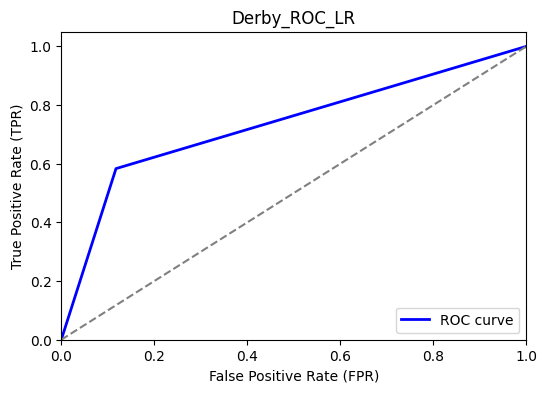

In [23]:
import matplotlib.pyplot as plt
from sklearn.metrics import roc_curve

# Compute ROC curve
fpr, tpr, thresholds = roc_curve(y_test, y_test_pred)

# Plot ROC curve
plt.figure(figsize=(6, 4))  # Set the figure size to be smaller
plt.plot(fpr, tpr, color='blue', lw=2, label='ROC curve')
plt.plot([0, 1], [0, 1], color='gray', linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate (FPR)')
plt.ylabel('True Positive Rate (TPR)')
plt.title('Derby_ROC_LR')
plt.legend(loc='lower right')

# Save the plot with a smaller image size
plt.savefig('Derby_ROC_LR.png', bbox_inches='tight')  # Adjust dpi for desired image size
plt.show()

--------------------------**LIME for Logistic Regression**----------------------

In [24]:
from lime.lime_text import LimeTextExplainer
class_names = list(train_df.label.unique())
explainer = LimeTextExplainer(class_names=class_names)

In [25]:
max_features = train_df.description.str.split().map(lambda x: len(x)).max()
print(max_features)

1280


In [26]:
from sklearn.pipeline import make_pipeline
pipe = make_pipeline(tfidf_vectorizer, lr)

In [27]:
import random

random.seed(21)
idx = random.randint(0, len(test))
print(idx)

exp = explainer.explain_instance(
    test.title.iloc[idx], pipe.predict_proba, num_features=5
)

42


In [28]:
print(
    f"Probability of sample to be non_security is: {pipe.predict_proba([test.title.iloc[idx]])}\n"
)
print(f"Explanation as a list of weighted features")
exp.as_list()

Probability of sample to be non_security is: [[0.51534879 0.48465121]]

Explanation as a list of weighted features


[('column', -0.08210593496493435),
 ('Accessing', 0.07211833861797033),
 ('value', 0.07083439580747526),
 ('BLOB', 0.06675734701158811),
 ('INSERT', 0.0533508629678879)]

In [29]:
[test.title.iloc[idx]]

['Accessing a BLOB column twice in an INSERT trigger leads to errors in the value on-disk']

In [30]:
exp.show_in_notebook(text=True)

In [31]:
# Naive Bayes Classifier
mnb = MultinomialNB()
mnb.fit(X_train_smote, y_train_smote)
y_train_pred = mnb.predict(X_train_smote)
y_test_pred = mnb.predict(X_test_tfidf)
training_scores(y_train_smote, y_train_pred)
validation_scores(y_test, y_test_pred)

Training Scores: Accuracy=0.933, precision=0.881, recall=1.0, F1-Score=0.937, roc=0.933
Validation Scores: Accuracy=0.7, precision=0.312, recall=0.833, F1-Score=0.455, roc=0.755


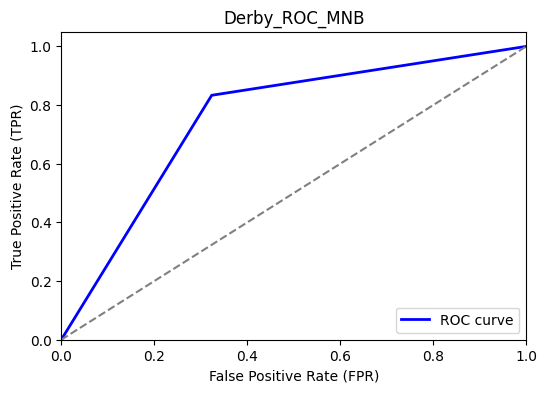

In [32]:
import matplotlib.pyplot as plt
from sklearn.metrics import roc_curve

# Compute ROC curve
fpr, tpr, thresholds = roc_curve(y_test, y_test_pred)

# Plot ROC curve
plt.figure(figsize=(6, 4))  # Set the figure size to be smaller
plt.plot(fpr, tpr, color='blue', lw=2, label='ROC curve')
plt.plot([0, 1], [0, 1], color='gray', linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate (FPR)')
plt.ylabel('True Positive Rate (TPR)')
plt.title('Derby_ROC_MNB')
plt.legend(loc='lower right')

# Save the plot with a smaller image size
plt.savefig('Derby_ROC_MNB.png', bbox_inches='tight')  # Adjust dpi for desired image size
plt.show()

--------------------------**LIME for Naive Bayes**----------------------

In [33]:
from lime.lime_text import LimeTextExplainer
class_names = list(train_df.label.unique())
explainer = LimeTextExplainer(class_names=class_names)

In [34]:
max_features = train_df.description.str.split().map(lambda x: len(x)).max()
print(max_features)

1280


In [35]:
from sklearn.pipeline import make_pipeline
pipe = make_pipeline(tfidf_vectorizer, mnb)

In [36]:
import random

random.seed(21)
idx = random.randint(0, len(test))
print(idx)

exp = explainer.explain_instance(
    test.title.iloc[idx], pipe.predict_proba, num_features=5
)

42


In [37]:
print(
    f"Probability of sample to be non_security is: {pipe.predict_proba([test.title.iloc[idx]])}\n"
)
print(f"Explanation as a list of weighted features")
exp.as_list()

Probability of sample to be non_security is: [[0.37205914 0.62794086]]

Explanation as a list of weighted features


[('BLOB', 0.08436840009668174),
 ('twice', -0.0704088240164113),
 ('Accessing', 0.05024715723235934),
 ('column', -0.04603031308748717),
 ('INSERT', 0.04451407213363861)]

In [38]:
[test.title.iloc[idx]]

['Accessing a BLOB column twice in an INSERT trigger leads to errors in the value on-disk']

In [39]:
exp.show_in_notebook(text=True)

In [40]:
# Random Forest Classifier
rf = RandomForestClassifier()
rf.fit(X_train_smote, y_train_smote)
y_train_pred = rf.predict(X_train_smote)
y_test_pred = rf.predict(X_test_tfidf)
training_scores(y_train_smote, y_train_pred)
validation_scores(y_test, y_test_pred)

Training Scores: Accuracy=1.0, precision=1.0, recall=1.0, F1-Score=1.0, roc=1.0
Validation Scores: Accuracy=0.881, precision=0.778, recall=0.292, F1-Score=0.424, roc=0.638


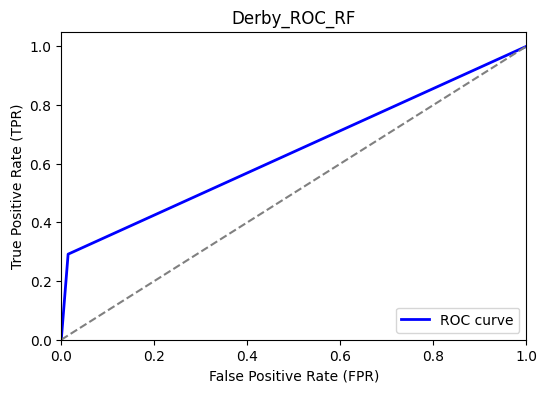

In [41]:
import matplotlib.pyplot as plt
from sklearn.metrics import roc_curve

# Compute ROC curve
fpr, tpr, thresholds = roc_curve(y_test, y_test_pred)

# Plot ROC curve
plt.figure(figsize=(6, 4))  # Set the figure size to be smaller
plt.plot(fpr, tpr, color='blue', lw=2, label='ROC curve')
plt.plot([0, 1], [0, 1], color='gray', linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate (FPR)')
plt.ylabel('True Positive Rate (TPR)')
plt.title('Derby_ROC_RF')
plt.legend(loc='lower right')

# Save the plot with a smaller image size
plt.savefig('Derby_ROC_RF.png', bbox_inches='tight')  # Adjust dpi for desired image size
plt.show()

----------------------**lime for Random Forest Classifier**---------------------

In [42]:
from sklearn.pipeline import make_pipeline
pipe = make_pipeline(tfidf_vectorizer, rf)

In [43]:
import random

random.seed(21)
idx = random.randint(0, len(test))
print(idx)

exp = explainer.explain_instance(
    test.title.iloc[idx], pipe.predict_proba, num_features=5
)

42


In [44]:
print(
    f"Probability of sample to be non_security is: {pipe.predict_proba([test.title.iloc[idx]])}\n"
)
print(f"Explanation as a list of weighted features")
exp.as_list()

Probability of sample to be non_security is: [[0.87 0.13]]

Explanation as a list of weighted features


[('INSERT', 0.04700196740175264),
 ('errors', 0.046903459890412565),
 ('Accessing', 0.04400983716939782),
 ('column', -0.011003292788022164),
 ('leads', 0.006699377462149547)]

In [45]:
[test.title.iloc[idx]]

['Accessing a BLOB column twice in an INSERT trigger leads to errors in the value on-disk']

In [46]:
exp.show_in_notebook(text=True)

In [47]:
# Extreme Gradient Boosting Classifier
xgb = XGBClassifier(objective='binary:logistic', eval_metric='logloss')
xgb.fit(X_train_smote, y_train_smote)
y_train_pred = xgb.predict(X_train_smote)
y_test_pred = xgb.predict(X_test_tfidf)
training_scores(y_train_smote, y_train_pred)
validation_scores(y_test, y_test_pred)

Training Scores: Accuracy=0.999, precision=1.0, recall=0.998, F1-Score=0.999, roc=0.999
Validation Scores: Accuracy=0.881, precision=0.632, recall=0.5, F1-Score=0.558, roc=0.724


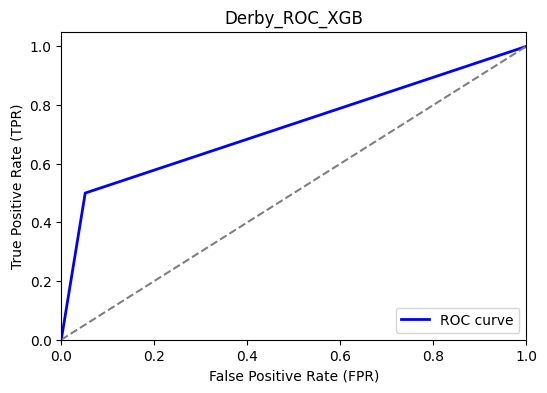

In [48]:
import matplotlib.pyplot as plt
from sklearn.metrics import roc_curve

# Compute ROC curve
fpr, tpr, thresholds = roc_curve(y_test, y_test_pred)

# Plot ROC curve
plt.figure(figsize=(6, 4))  # Set the figure size to be smaller
plt.plot(fpr, tpr, color='blue', lw=2, label='ROC curve')
plt.plot([0, 1], [0, 1], color='gray', linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate (FPR)')
plt.ylabel('True Positive Rate (TPR)')
plt.title('Derby_ROC_XGB')
plt.legend(loc='lower right')

# Save the plot with a smaller image size
plt.savefig('Derby_ROC_XGB.png', bbox_inches='tight')  # Adjust dpi for desired image size
plt.show()

---------------------**lime for Extreme Gradient Boosting**---------------------

In [49]:
from sklearn.pipeline import make_pipeline
pipe = make_pipeline(tfidf_vectorizer, xgb)

In [50]:
import random

random.seed(21)
idx = random.randint(0, len(test))
print(idx)

exp = explainer.explain_instance(
    test.title.iloc[idx], pipe.predict_proba, num_features=5
)

42


In [51]:
print(
    f"Probability of sample to be non_security is: {pipe.predict_proba([test.title.iloc[idx]])}\n"
)
print(f"Explanation as a list of weighted features")
exp.as_list()

Probability of sample to be non_security is: [[0.97025764 0.02974238]]

Explanation as a list of weighted features


[('column', -0.022476816204548045),
 ('errors', 0.01986471521350629),
 ('Accessing', 0.00466905220161063),
 ('INSERT', 0.003044238065735036),
 ('value', -0.0020316417861593844)]

In [52]:
[test.title.iloc[idx]]

['Accessing a BLOB column twice in an INSERT trigger leads to errors in the value on-disk']

In [53]:
exp.show_in_notebook(text=True)

In [54]:
pip install lime

**SMOTE WITH 60:40 RATIO**

(843, 10012) (843,)
(1326, 11756) (1326,)


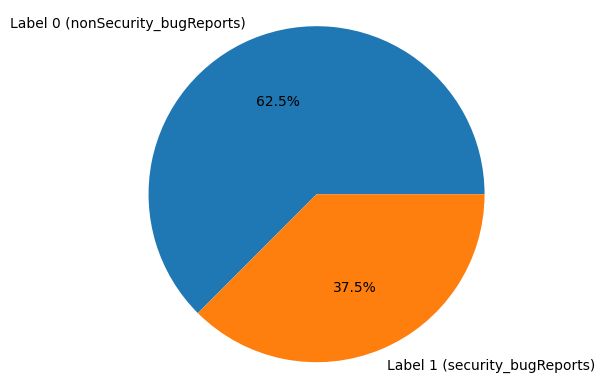

In [55]:
# SMOTE to deal with the class imbalance
smote = SMOTE(sampling_strategy=0.6)
X_train_smote, y_train_smote = smote.fit_resample(X_train_tfidf, y_train.values)
print(X_train_smote.shape, y_train_smote.shape)

# SMOTE on full training data
smote = SMOTE()
X_smote, y_smote = smote.fit_resample(X_tfidf, y.values)
print(X_smote.shape, y_smote.shape)

# Class Imbalance Check
plt.pie(pd.value_counts(y_train_smote),
        labels=['Label 0 (nonSecurity_bugReports)', 'Label 1 (security_bugReports)'],
        autopct='%0.1f%%')
plt.axis('equal')
plt.show()

In [56]:
# Functions to print scores
def training_scores(y_act, y_pred):
    acc = round(accuracy_score(y_act, y_pred), 3)
    f1 = round(f1_score(y_act, y_pred), 3)
    precision = round(precision_score(y_act, y_pred), 3)
    recall = round(recall_score(y_act, y_pred), 3)
    roc_auc = round(roc_auc_score(y_act, y_pred), 3)
    print(f'Training Scores: Accuracy={acc}, precision={precision}, recall={recall}, F1-Score={f1}, roc={roc_auc}')

def validation_scores(y_act, y_pred):
    acc = round(accuracy_score(y_act, y_pred), 3)
    f1 = round(f1_score(y_act, y_pred), 3)
    precision = round(precision_score(y_act, y_pred), 3)
    recall = round(recall_score(y_act, y_pred), 3)
    roc_auc = round(roc_auc_score(y_act, y_pred), 3)
    print(f'Validation Scores: Accuracy={acc}, precision={precision}, recall={recall}, F1-Score={f1}, roc={roc_auc}')

In [57]:
# Logistic Regression
lr = LogisticRegression()
lr.fit(X_train_smote, y_train_smote)
y_train_pred = lr.predict(X_train_smote)
y_test_pred = lr.predict(X_test_tfidf)
training_scores(y_train_smote, y_train_pred)
validation_scores(y_test, y_test_pred)

Training Scores: Accuracy=0.909, precision=0.938, recall=0.81, F1-Score=0.869, roc=0.889
Validation Scores: Accuracy=0.862, precision=0.556, recall=0.417, F1-Score=0.476, roc=0.679


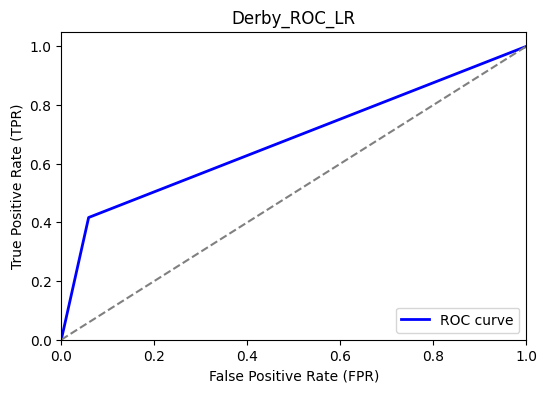

In [58]:
import matplotlib.pyplot as plt
from sklearn.metrics import roc_curve

# Compute ROC curve
fpr, tpr, thresholds = roc_curve(y_test, y_test_pred)

# Plot ROC curve
plt.figure(figsize=(6, 4))  # Set the figure size to be smaller
plt.plot(fpr, tpr, color='blue', lw=2, label='ROC curve')
plt.plot([0, 1], [0, 1], color='gray', linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate (FPR)')
plt.ylabel('True Positive Rate (TPR)')
plt.title('Derby_ROC_LR')
plt.legend(loc='lower right')

# Save the plot with a smaller image size
plt.savefig('Derby_ROC_LR_r4.png', bbox_inches='tight')  # Adjust dpi for desired image size
plt.show()

---------------------**lime for Logistic Regression**---------------------

In [59]:
from lime.lime_text import LimeTextExplainer
class_names = list(train_df.label.unique())
explainer = LimeTextExplainer(class_names=class_names)

In [60]:
max_features = train_df.description.str.split().map(lambda x: len(x)).max()
print(max_features)

1280


In [61]:
from sklearn.pipeline import make_pipeline
pipe = make_pipeline(tfidf_vectorizer, lr)

In [62]:
import random

random.seed(21)
idx = random.randint(0, len(test))
print(idx)

exp = explainer.explain_instance(
    test.title.iloc[idx], pipe.predict_proba, num_features=5
)

42


In [63]:
print(
    f"Probability of sample to be non_security is: {pipe.predict_proba([test.title.iloc[idx]])}\n"
)
print(f"Explanation as a list of weighted features")
exp.as_list()

Probability of sample to be non_security is: [[0.63296369 0.36703631]]

Explanation as a list of weighted features


[('Accessing', 0.06627790434608924),
 ('value', 0.05018133336698909),
 ('column', -0.048149054182070855),
 ('BLOB', 0.03698659022940545),
 ('twice', -0.0337313321194377)]

In [64]:
[test.title.iloc[idx]]

['Accessing a BLOB column twice in an INSERT trigger leads to errors in the value on-disk']

In [65]:
exp.show_in_notebook(text=True)

In [66]:
# Naive Bayes Classifier
mnb = MultinomialNB()
mnb.fit(X_train_smote, y_train_smote)
y_train_pred = mnb.predict(X_train_smote)
y_test_pred = mnb.predict(X_test_tfidf)
training_scores(y_train_smote, y_train_pred)
validation_scores(y_test, y_test_pred)

Training Scores: Accuracy=0.931, precision=0.957, recall=0.854, F1-Score=0.903, roc=0.916
Validation Scores: Accuracy=0.838, precision=0.444, recall=0.333, F1-Score=0.381, roc=0.63


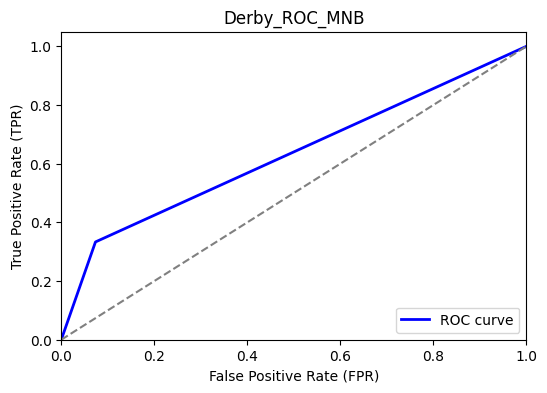

In [67]:
import matplotlib.pyplot as plt
from sklearn.metrics import roc_curve

# Compute ROC curve
fpr, tpr, thresholds = roc_curve(y_test, y_test_pred)

# Plot ROC curve
plt.figure(figsize=(6, 4))  # Set the figure size to be smaller
plt.plot(fpr, tpr, color='blue', lw=2, label='ROC curve')
plt.plot([0, 1], [0, 1], color='gray', linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate (FPR)')
plt.ylabel('True Positive Rate (TPR)')
plt.title('Derby_ROC_MNB')
plt.legend(loc='lower right')

# Save the plot with a smaller image size
plt.savefig('Derby_ROC_MNB_r4.png', bbox_inches='tight')  # Adjust dpi for desired image size
plt.show()

----------------------------**lime for Naive Bayes**----------------------------

In [68]:
from sklearn.pipeline import make_pipeline
pipe = make_pipeline(tfidf_vectorizer, mnb)

In [69]:
import random

random.seed(21)
idx = random.randint(0, len(test))
print(idx)

exp = explainer.explain_instance(
    test.title.iloc[idx], pipe.predict_proba, num_features=5
)

42


In [70]:
print(
    f"Probability of sample to be non_security is: {pipe.predict_proba([test.title.iloc[idx]])}\n"
)
print(f"Explanation as a list of weighted features")
exp.as_list()

Probability of sample to be non_security is: [[0.67330896 0.32669104]]

Explanation as a list of weighted features


[('column', -0.06002839241878626),
 ('twice', -0.04700603104875533),
 ('Accessing', 0.03656291117820962),
 ('BLOB', 0.03199731743816885),
 ('disk', -0.010936683373836494)]

In [71]:
[test.title.iloc[idx]]

['Accessing a BLOB column twice in an INSERT trigger leads to errors in the value on-disk']

In [72]:
exp.show_in_notebook(text=True)

In [73]:
# Random Forest Classifier
rf = RandomForestClassifier()
rf.fit(X_train_smote, y_train_smote)
y_train_pred = rf.predict(X_train_smote)
y_test_pred = rf.predict(X_test_tfidf)
training_scores(y_train_smote, y_train_pred)
validation_scores(y_test, y_test_pred)

Training Scores: Accuracy=1.0, precision=1.0, recall=1.0, F1-Score=1.0, roc=1.0
Validation Scores: Accuracy=0.881, precision=0.778, recall=0.292, F1-Score=0.424, roc=0.638


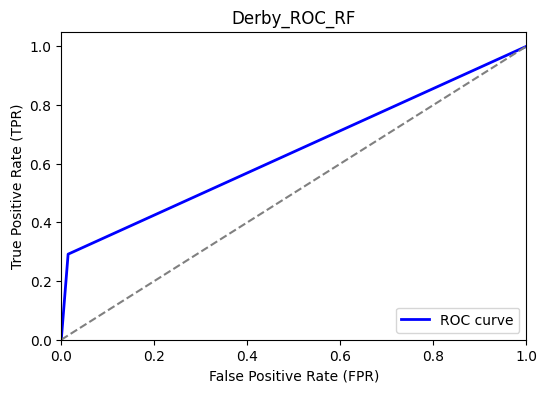

In [74]:
import matplotlib.pyplot as plt
from sklearn.metrics import roc_curve

# Compute ROC curve
fpr, tpr, thresholds = roc_curve(y_test, y_test_pred)

# Plot ROC curve
plt.figure(figsize=(6, 4))  # Set the figure size to be smaller
plt.plot(fpr, tpr, color='blue', lw=2, label='ROC curve')
plt.plot([0, 1], [0, 1], color='gray', linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate (FPR)')
plt.ylabel('True Positive Rate (TPR)')
plt.title('Derby_ROC_RF')
plt.legend(loc='lower right')

# Save the plot with a smaller image size
plt.savefig('Derby_ROC_RF_r4.png', bbox_inches='tight')  # Adjust dpi for desired image size
plt.show()

----------------------**lime for Random Forest Classifier**---------------------

In [75]:
from sklearn.pipeline import make_pipeline
pipe = make_pipeline(tfidf_vectorizer, rf)

In [76]:
import random

random.seed(21)
idx = random.randint(0, len(test))
print(idx)

exp = explainer.explain_instance(
    test.title.iloc[idx], pipe.predict_proba, num_features=5
)

42


In [77]:
print(
    f"Probability of sample to be non_security is: {pipe.predict_proba([test.title.iloc[idx]])}\n"
)
print(f"Explanation as a list of weighted features")
exp.as_list()

Probability of sample to be non_security is: [[0.87 0.13]]

Explanation as a list of weighted features


[('errors', 0.03849146615835446),
 ('Accessing', 0.03144580253907145),
 ('INSERT', 0.02858782031915065),
 ('leads', 0.016236848957668554),
 ('trigger', 0.006443733110602302)]

In [78]:
[test.title.iloc[idx]]

['Accessing a BLOB column twice in an INSERT trigger leads to errors in the value on-disk']

In [79]:
exp.show_in_notebook(text=True)

In [80]:
# Extreme Gradient Boosting Classifier
xgb = XGBClassifier(objective='binary:logistic', eval_metric='logloss')
xgb.fit(X_train_smote, y_train_smote)
y_train_pred = xgb.predict(X_train_smote)
y_test_pred = xgb.predict(X_test_tfidf)
training_scores(y_train_smote, y_train_pred)
validation_scores(y_test, y_test_pred)

Training Scores: Accuracy=0.999, precision=1.0, recall=0.997, F1-Score=0.998, roc=0.998
Validation Scores: Accuracy=0.875, precision=0.625, recall=0.417, F1-Score=0.5, roc=0.686


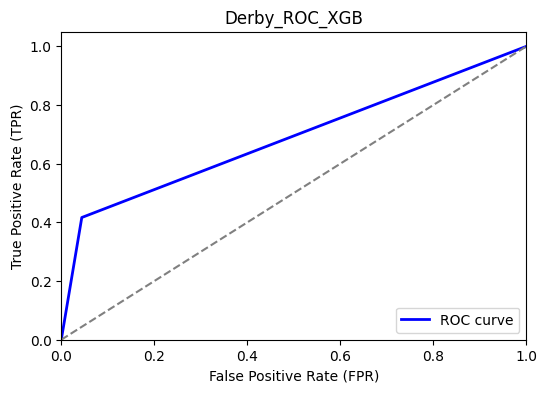

In [81]:
import matplotlib.pyplot as plt
from sklearn.metrics import roc_curve

# Compute ROC curve
fpr, tpr, thresholds = roc_curve(y_test, y_test_pred)

# Plot ROC curve
plt.figure(figsize=(6, 4))  # Set the figure size to be smaller
plt.plot(fpr, tpr, color='blue', lw=2, label='ROC curve')
plt.plot([0, 1], [0, 1], color='gray', linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate (FPR)')
plt.ylabel('True Positive Rate (TPR)')
plt.title('Derby_ROC_XGB')
plt.legend(loc='lower right')

# Save the plot with a smaller image size
plt.savefig('Derby_ROC_XGB_r4.png', bbox_inches='tight')  # Adjust dpi for desired image size
plt.show()

---------------------**lime for Extreme Gradient Boosting**---------------------

In [82]:
from sklearn.pipeline import make_pipeline
pipe = make_pipeline(tfidf_vectorizer, xgb)

In [83]:
import random

random.seed(21)
idx = random.randint(0, len(test))
print(idx)

exp = explainer.explain_instance(
    test.title.iloc[idx], pipe.predict_proba, num_features=5
)

42


In [84]:
print(
    f"Probability of sample to be non_security is: {pipe.predict_proba([test.title.iloc[idx]])}\n"
)
print(f"Explanation as a list of weighted features")
exp.as_list()

Probability of sample to be non_security is: [[0.9208299  0.07917009]]

Explanation as a list of weighted features


[('errors', 0.03636052660135996),
 ('column', -0.026045561362370656),
 ('on', 0.013117538413707499),
 ('disk', 0.012944189929512741),
 ('twice', 0.012338330010235262)]

In [85]:
[test.title.iloc[idx]]

['Accessing a BLOB column twice in an INSERT trigger leads to errors in the value on-disk']

In [86]:
exp.show_in_notebook(text=True)